### End to End Multicalss Dog Breed Classification
This notebook builds an end-to-end multi-class image classifire using
Tensorflow 2.0 and Tensorflow Hub.

1. Problem:
Identifying the breed of the dog given an image of dog.

2. Data: From Kaggle
3. Evaluation:
The Evaluation is a file with prediction probabilities for each dog breed of each test image.
4. Features:
Information about the data
 * dealing with images (unstructured data), so it's best to use deep learning/ transfer learning.
 * There are 10K+ images in train set.
 * There are 10K+ images in test set

In [3]:
# unzip the data pulled form Kaggle.com (Sometimes files get missing form google drive, if this happened, deleted the folder, empty trash, create a new folder using same name, and unzip again, then check file counts)
# !unzip "file's-path" -d "destination-directory"
# !unzip "/content/drive/MyDrive/Colab Notebooks/Data/dog-breed-model-zipped/train(1).zip" -d "/content/drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/"

In [4]:
# Check if all the images length on the directory matches with the id count
import os
train_dir_img_path = 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train'
dir_file_count = len(os.listdir(train_dir_img_path))
print(dir_file_count)

10222


# Setting up Worksapce
1. Import Tensorflow and Tensorflow Hub
2. Make sure code is using GPU (to use GPU change Runtime to GPU)

In [5]:
# Import Tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check For GPU availability (o use GPU change Runtime to GPU)
print("GPU", "available (Yess!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not Available")

TF version: 2.13.0
TF Hub version: 0.15.0
GPU available (Yess!!!!!!!!)


In [6]:
# upgrading Tensorflow to new version and restart colab runtime
"""
try:
  %tensorflow_version 3.x
except Exception:
  pass
"""

'\ntry:\n  %tensorflow_version 3.x\nexcept Exception:\n  pass\n'

### 1. Convert Data into Tensor:
With all machine learning models, data has to be in numerical format.
- First access data and check the labels (using pandas)

In [7]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Data/dog-breed-model/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [8]:
# how many images per breed
image_count = labels_csv["breed"].value_counts()
image_count

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

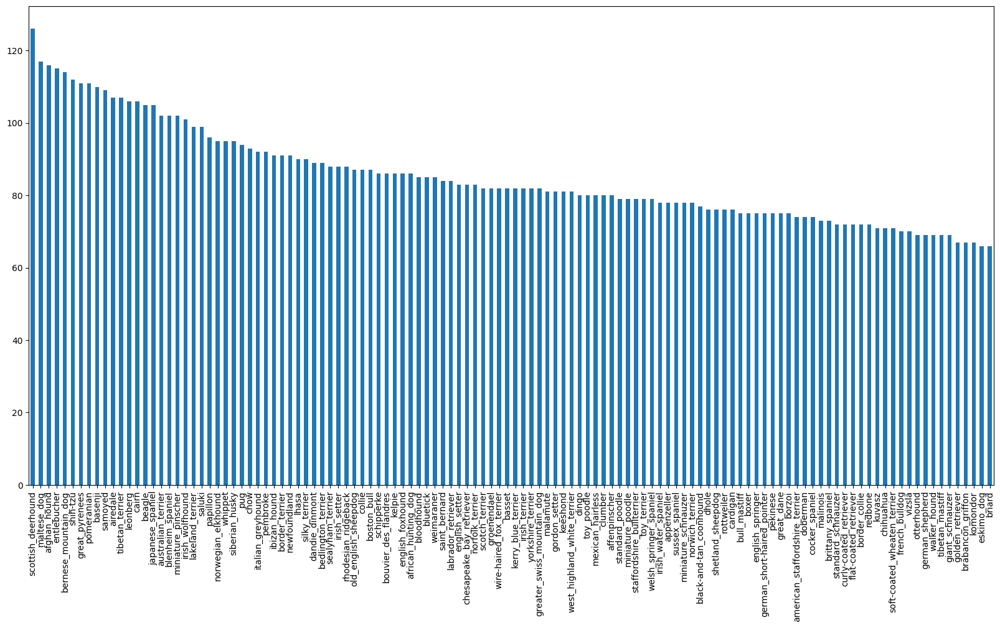

In [9]:
# images per breed plot
image_count.plot.bar(figsize=(20,10))

boston_bull


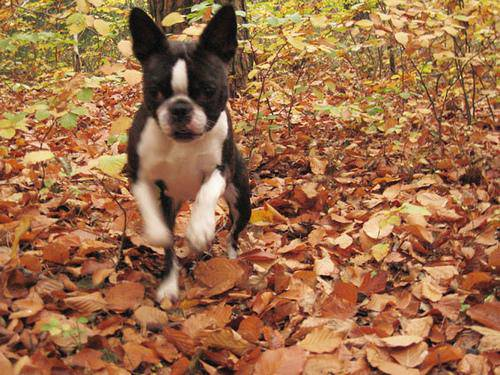

In [10]:
# Let's view an image (first image and last)
from IPython.display import Image
first_img = labels_csv.iloc[0]
last_img = labels_csv.iloc[-1]
print(first_img.breed)
Image(f"/content/drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/{first_img.id}.jpg")

chesapeake_bay_retriever


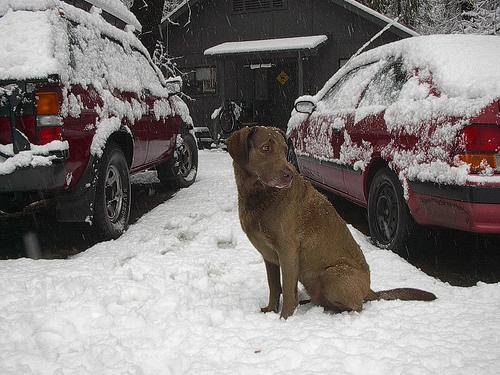

In [11]:
print(last_img.breed)
Image(f"/content/drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/{last_img.id}.jpg")

# Getting images and their labels
- get a list of all images file patnames

In [12]:
filenames = ["drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10] # first 10 id

['drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# Check if all the images length on the directory matches with the id count
import os
train_dir_img_path = 'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train'
dir_file_count = len(os.listdir(train_dir_img_path))
# print(dir_file_count)
print(dir_file_count, len(labels_csv["id"]))
# !ls drive/MyDrive/'Colab Notebooks'/Data/dog-breed-model/train/
# os.listdir("drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train")

10222 10222


### After testing the images, prepare the lables

In [14]:
# Get labels ready || convert labels into numpy array
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
# check number of labels vs number of image files | check if there is any missing data
print(dir_file_count, len(labels_csv["breed"]))

10222 10222


In [16]:
# Find the unique label values
# np.unique(labels) and labels_csv["breed"].unique() is different in array arrangment
unique_breeds = np.unique(labels)
print("Unique Lables", len(unique_breeds))

Unique Lables 120


In [17]:
# Turb a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
7 == np.array([1,2,3,4,5,6,7])

array([False, False, False, False, False, False,  True])

In [19]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Turn boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where maximum number (True) first occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
np.array([1,0,0,7,0,0,0]).argmax() # return the index of the max

3

In [23]:
# Turning Second Boolean Array into Integer
print(labels[1])
print(boolean_labels[1].astype(int))

dingo
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Split Data into Training and Validation
Science the dataset does not come with validation set. We will split all data into training and validation set.

* setup X and y variable

In [24]:
# setup X and y variables
X = filenames
y = boolean_labels
len(X), len(y)

(10222, 10222)

### Let's start with ~1000 images and increase as later steeps

In [71]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step: 1000}
NUM_IMAGES

1000

In [26]:
# let's split data into train and validation using scikit learn
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(8000, 8000, 2000, 2000)

In [27]:
# Let's have a geez/look at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/e86be20abe3ab746179728fa6f19bc59.jpg',
  'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/269a6aeefd8050aafda02044c9cd2a80.jpg',
  'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/2974dccc97c0cb25f7873e33a4730f47.jpg',
  'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/99b31cac1b20997c30d49cd6a2d9cde4.jpg',
  'drive/MyDrive/Colab Notebooks/Data/dog-breed-model/train/a7702c83da79d54e27d2e9b1f01fe64e.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,



### Preprocessing Images => Turning images into Tensors
Task implemented as Fn:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn the `image` into Tensor
4. Resize the `image` to be a shape of (224,224) [same size for all the images]
5. Return the modified image

* Search more : `Tensorflow Data Loading`

In [28]:
# Convert image to a Numpy array to see how it looks
from matplotlib.pyplot import imread
image = imread(filenames[42]) # Turning an image into RGB values
image.shape, image.max(), image
# filenames[42]

((257, 350, 3),
 255,
 array([[[ 89, 137,  89],
         [ 76, 124,  76],
         [ 63, 111,  61],
         ...,
         [ 77, 133,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  75],
         [ 67, 114,  68],
         [ 63, 110,  64],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 132,  84]],
 
        [[ 56, 104,  66],
         [ 58, 106,  68],
         [ 64, 112,  74],
         ...,
         [ 71, 127,  82],
         [ 73, 129,  84],
         [ 74, 130,  85]],
 
        ...,
 
        [[  2,  11,  10],
         [  5,  14,  11],
         [  8,  14,  14],
         ...,
         [120, 113,  67],
         [126, 118,  71],
         [122, 114,  67]],
 
        [[  0,   3,   7],
         [  2,   7,  10],
         [  3,   9,   7],
         ...,
         [105,  98,  54],
         [112, 104,  58],
         [111, 103,  57]],
 
        [[ 16,  18,  30],
         [ 16,  19,  24],
         [ 15,  20,  14],
         ...,
      

In [29]:
# Turning an imread image into Tensor
tf.constant(image)
# Its a Tensor Object Containing the Image Numpy Array, which can run inside a GPU

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [30]:
# Raw image into Raw Tensor
tensor_ex = tf.io.read_file(filenames[42])
tensor_ex

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [31]:
# Convert Raw Image Into Decoded Tensor of RGB
tensor_image_rgb = tf.image.decode_jpeg(tensor_ex, channels=3)
tensor_image_rgb

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [32]:
# convert decoded tensor into float32
tensor_img_con_float32 = tf.image.convert_image_dtype(tensor_image_rgb, tf.float32)
tensor_img_con_float32

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [33]:
# Resize a Tensor'd Float32 Image
tf.image.resize(tensor_img_con_float32, size=[224, 224]) # it will change all the element and the array shape

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

### After inspecting what a Tensor is, build the function:
* Take an image filepath as input
* Use Tensorflow to read the file and save it to a variable, image
* Turn the image into Tensor
* Normalize the image | Turn 0-255 to 0-1 float
* Resize the image to be a shape of (224,224) [same size for all the images]
* Return the modified image

In [34]:
# Define Image Size
IMG_SIZE = 224

def process_image (image_path):
  # Read image using tensorflow
  image = tf.io.read_file(image_path)
  # Turn jpeg image into numerical Tensor with 3 color channels (RGB), same as imread
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalization: Convert color values from 0-255 to between 0-1 values in float
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning data to Tensor Conversion into batches:
* Trying to process 10,000+ images is very compute expensize (even on gpus). Doing those at once may go out of memory and throw error. So smaller size batch can be a good solution.

* Let's do 32 images at a time

Task:
* In order to use Tensorflow effectively, data needs in the form of Tensor Tuples which look like `(image, label)`

In [35]:
# Function to return a tuple of tensors
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [36]:
# Demo of a processed image and label using functions
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

### Batch Conversion Function:

In [37]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesnt shuffle if it's validation data
  Also accepts test data as input (no labels)
  """

  # If the data is a test dataset, there is no label
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # First time creating Tensor from image path
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, no need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # Shuffling pathname and labels befor mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuple, this also turns the image path into a preprocessed image
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [38]:
# Test Functions : Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [39]:
train_data, val_data

(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [40]:
t1, t2 = next(train_data.as_numpy_iterator())
t1,t2

(array([[[[0.4529412 , 0.34201682, 0.26302522],
          [0.42899162, 0.3152661 , 0.252521  ],
          [0.45399162, 0.33634454, 0.30153063],
          ...,
          [0.56401384, 0.48950404, 0.47381777],
          [0.5753901 , 0.5008803 , 0.485194  ],
          [0.5631453 , 0.48863548, 0.4729492 ]],
 
         [[0.45782316, 0.33129254, 0.26539618],
          [0.44523814, 0.31765708, 0.2590036 ],
          [0.48268312, 0.35084036, 0.2997199 ],
          ...,
          [0.58907586, 0.5013706 , 0.47777134],
          [0.58465356, 0.49124575, 0.4726887 ],
          [0.59814924, 0.5066426 , 0.48640457]],
 
         [[0.47131857, 0.32131854, 0.27867147],
          [0.4736995 , 0.32481995, 0.27376953],
          [0.5009204 , 0.35589236, 0.277511  ],
          ...,
          [0.6497027 , 0.5516635 , 0.52421254],
          [0.62145025, 0.52341104, 0.49596003],
          [0.61750734, 0.5194681 , 0.49201715]],
 
         ...,
 
         [[0.5493022 , 0.40812576, 0.35322377],
          [0.63123

In [41]:
# first iteration will get 1st batch size (32) tuple of (Tensor-X,Tensor-y)
t1[0][:1][:1], t2[0]

(array([[[0.4529412 , 0.34201682, 0.26302522],
         [0.42899162, 0.3152661 , 0.252521  ],
         [0.45399162, 0.33634454, 0.30153063],
         [0.4883754 , 0.36680675, 0.35595238],
         [0.51257503, 0.36923772, 0.36006403],
         [0.5562125 , 0.40451184, 0.37055823],
         [0.56856745, 0.41880757, 0.3611945 ],
         [0.56356543, 0.412345  , 0.34481794],
         [0.55858344, 0.40650263, 0.33940578],
         [0.5920369 , 0.49063635, 0.41388565],
         [0.5487395 , 0.44285718, 0.36834735],
         [0.49540824, 0.37383962, 0.30325136],
         [0.45526212, 0.32585034, 0.25918368],
         [0.4372749 , 0.327561  , 0.25977388],
         [0.4650961 , 0.36705688, 0.28638458],
         [0.4815026 , 0.37437972, 0.28676468],
         [0.49347743, 0.3758804 , 0.3177871 ],
         [0.48599443, 0.35056022, 0.32612047],
         [0.50063026, 0.36617646, 0.30567226],
         [0.5540015 , 0.43691468, 0.39545804],
         [0.6075231 , 0.49659875, 0.4568228 ],
         [0.5

(<matplotlib.image.AxesImage at 0x7b963fcc5f00>, 'beagle')

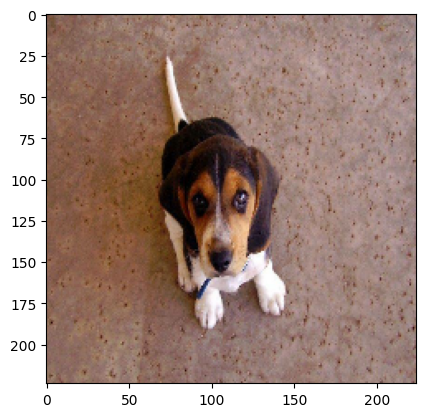

In [42]:
# show the fist image
import matplotlib.pyplot as plt
plt.imshow(t1[0]), unique_breeds[t2[0].argmax()]

In [43]:
# Checkout different attr of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches


In [44]:
import matplotlib.pyplot as plt

# Create fn for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  for i in range(25):
    # Create subplots (5 rows 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [45]:
# Fist tuple data of the prepared training data, it will process a batch of 32 tensors
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.92156886e-03, 3.92156886e-03, 3.92156886e-03],
          [7.84313772e-03, 7.84313772e-03, 7.84313772e-03],
          [1.20798349e-02, 1.20798349e-02, 1.20798349e-02],
          ...,
          [2.45664999e-01, 1.24096364e-01, 4.17434238e-02],
          [2.58397967e-01, 1.49189308e-01, 5.32858521e-02],
          [2.80038536e-01, 1.74156174e-01, 6.82738274e-02]],
 
         [[6.78396458e-03, 6.78396458e-03, 6.78396458e-03],
          [7.84313772e-03, 7.84313772e-03, 7.84313772e-03],
          [1.18498197e-02, 1.18498197e-02, 1.18498197e-02],
          ...,
          [2.45483279e-01, 1.23914644e-01, 4.15616967e-02],
          [2.62441993e-01, 1.52798831e-01, 5.81988543e-02],
          [2.43035108e-01, 1.34290352e-01, 3.69951837e-02]],
 
         [[8.69222730e-03, 8.69222730e-03, 8.69222730e-03],
          [8.69222730e-03, 8.69222730e-03, 8.69222730e-03],
          [1.09156165e-02, 1.09156165e-02, 1.09156165e-02],
          ...,
          [2.80626774e-01, 1.59058124e-01, 7.7554

In [46]:
# Get returned data's batch length
len(train_images), len(train_labels)

(32, 32)

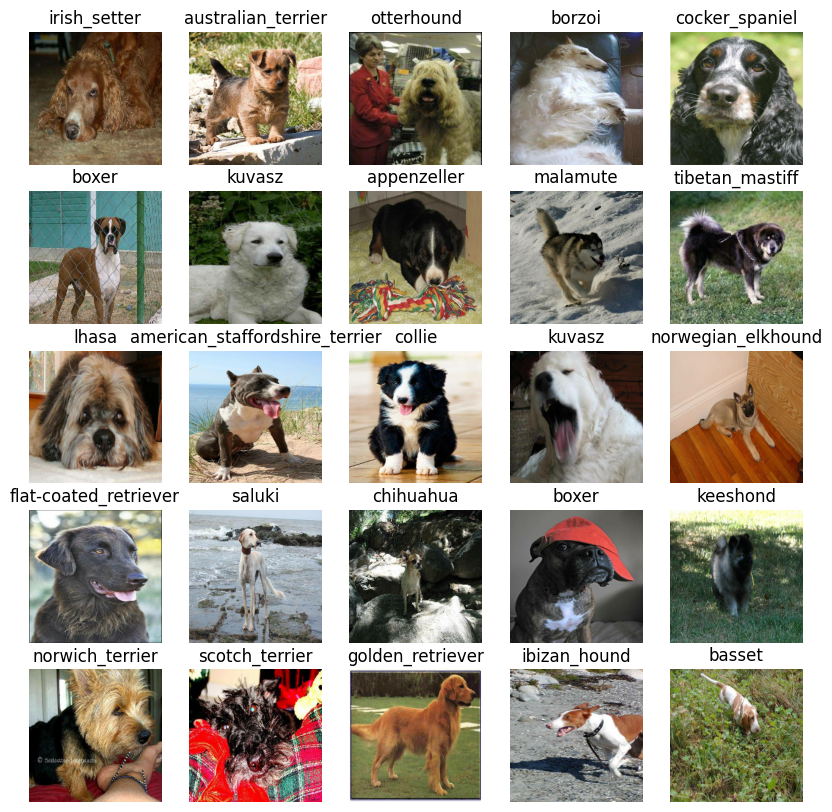

In [47]:
# Visualization of the 25 images
show_25_images(train_images, train_labels)

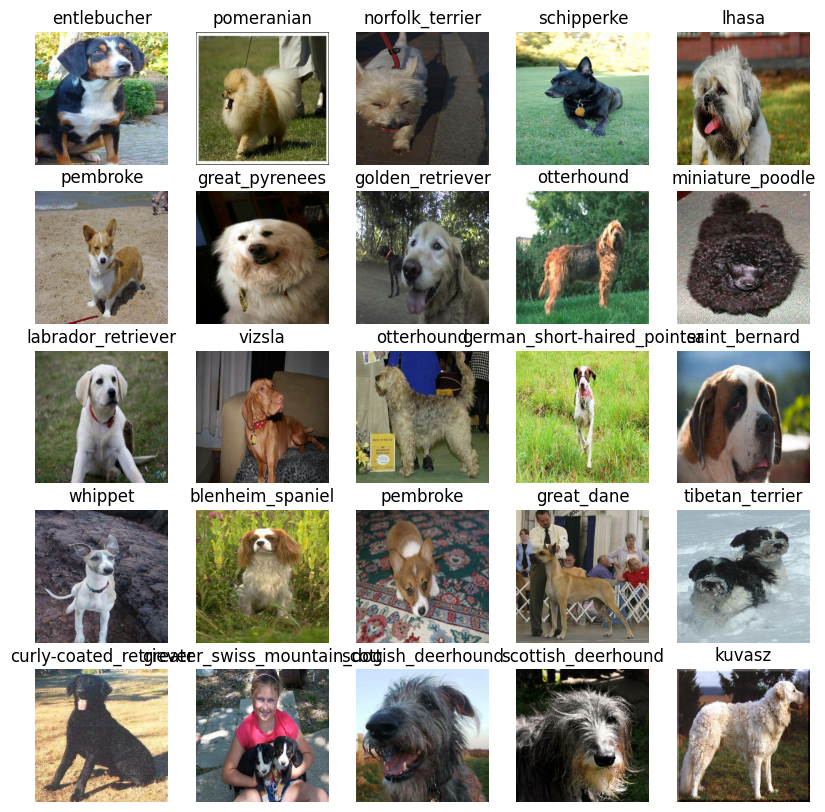

In [48]:
# lets visualize validation images
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Bulding the model:
After the data ready, the next tasks are
* The input shape (images shape in the form of Tensor) to the model
* The output shape (image labels in the from of Tensors) of our model
* Define the model and add the URL of the model to select

In [49]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


### Keras deep learning model:
Define a function with
- Takes the input shape, output shape and the model we've choosen as parameter
- Defines the layer in a Keras model in sequential fashion (do this first, then this, then that)
- Compiles the model (says it should be evaluated and improved)
- Builds the Model (tell the model the input shape it'll be getting)
- Returns the Model

docs about Keras: https://www.tensorflow.org/guide/keras

In [50]:
from keras.src.layers.attention.multi_head_attention import activation
# function that build a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with : ", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Input layer
      tf.keras.layers.Dense(units=output_shape, activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # Build the model
  model.build(input_shape)

  return model

In [51]:
model = create_model()
model.summary()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Model Instantiation:
Convolutional Nural Network
- A Convolutional Neural Network, also known as CNN or ConvNet, is a class of neural networks that specializes in processing data that has a grid-like topology, such as an image.

Dense Layer
- Dense Layer is simple layer of neurons in which each neuron receives input from all the neurons of previous layer, thus called as dense. Dense Layer is used to classify image based on output from convolutional layers. Working of single neuron. A layer contains multiple number of such neurons.

Softmax vs Sigmoid
- Softmax (Multicalss Classification) & Categorical Crossentropy
- Sigmoid (Binary Classification) & Binary Crossentropy

### Model Compilation:
Consist of mostly 3 part
- loss function (to track the performance)
- optimizer (to optimize model compilation)
- metrics (to provie model's accuracy)

### Model Building:
Finally build the model with input shape

### Callbacks:
Callback functions are helper function a model can use during training to do such things as save its progress, check its progress or stop training erly if a model stops improving.
EX
- Callback for tensorboard to track model pregress
- Callback for early stopping to prevent model from training for too long or from over-fitting

`TensorBoard`: It's a tool for providing the measurements and visualizations needed during the machine learning workflow

Tensorboard Setup:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's fit() function.
3. Visualize the models training logs whith the %tensorboard magic fn. (after model training)

In [52]:
# Load Tensorboard notebook extension:
%load_ext tensorboard
import datetime

def create_tensorboard_callback ():
  # Create log directory for Tensor-Borad's logs
  logdir = os.path.join("drive/MyDrive/Colab Notebooks/Data/dog-breed-model/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback:
It's a callback to stop model form over fitting.

In [53]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

### Model Training (Fn):
First start training on smaller number of data to check everything is working.

And Define Epoches
* One Epoche is One cycle of a dataset being trained. (or training the neural network with all the training data for one cycle)

In [54]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


### Create fn:
- Create a model
- setup a TensorBoard callback using `create_tensorboard_callback`
- Call the fit() fn on our model passing it the training data, validation data, number of epoches to train for and the callbacks
- Return the model

In [55]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [58]:
model = train_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
250/250 [==============================] - 1538s 6s/step - loss: 1.5079 - accuracy: 0.6432 - val_loss: 0.7325 - val_accuracy: 0.7765
Epoch 2/100
250/250 [==============================] - 29s 115ms/step - loss: 0.4051 - accuracy: 0.8850 - val_loss: 0.6844 - val_accuracy: 0.7835
Epoch 3/100
250/250 [==============================] - 35s 140ms/step - loss: 0.2298 - accuracy: 0.9421 - val_loss: 0.6640 - val_accuracy: 0.7935
Epoch 4/100
250/250 [==============================] - 33s 133ms/step - loss: 0.1446 - accuracy: 0.9707 - val_loss: 0.6469 - val_accuracy: 0.7980
Epoch 5/100
250/250 [==============================] - 29s 115ms/step - loss: 0.0984 - accuracy: 0.9830 - val_loss: 0.6560 - val_accuracy: 0.7980
Epoch 6/100
250/250 [==============================] - 29s 114ms/step - loss: 0.0716 - accuracy: 0.9905 - val_loss: 0.6703 - val_accuracy: 0.7990
Epoch 7/100
250/250 [=========

### Check Tensorboard Logs:

In [59]:
# Escape the `space` with black slash
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Data/dog-breed-model/logs

Output hidden; open in https://colab.research.google.com to view.

### Trained Model Evaluation:


In [60]:
predictions = model.predict(val_data,  verbose=1)
predictions

63/63 [==============================] - 6s 86ms/step


array([[1.5443428e-09, 9.7392809e-11, 1.9065358e-09, ..., 8.2340434e-10,
        2.1730147e-08, 3.6310108e-11],
       [6.5082816e-07, 6.2376650e-08, 5.0896887e-10, ..., 2.9513661e-10,
        1.1043189e-09, 8.0775253e-09],
       [6.6832302e-04, 7.5776246e-05, 9.6909816e-06, ..., 2.5097511e-06,
        1.3268829e-04, 1.5574982e-03],
       ...,
       [1.6825836e-05, 3.4802003e-06, 4.5417667e-07, ..., 1.1659106e-05,
        1.9848010e-06, 1.3136770e-02],
       [8.4346723e-08, 9.7244772e-09, 1.9816444e-09, ..., 5.2574666e-07,
        2.6679004e-04, 1.4453354e-08],
       [3.5171098e-07, 6.5546737e-05, 5.0235210e-10, ..., 4.4121888e-09,
        5.1449174e-06, 4.9922019e-06]], dtype=float32)

In [61]:
predictions[0]

array([1.5443428e-09, 9.7392809e-11, 1.9065358e-09, 1.3556658e-08,
       2.6483116e-07, 8.2204366e-05, 7.0805064e-09, 6.0669674e-07,
       3.8870615e-10, 1.4250259e-06, 2.2734663e-09, 3.2445328e-08,
       1.4750424e-07, 6.5182668e-09, 3.2287381e-10, 1.1078105e-06,
       6.7349983e-09, 2.4476170e-08, 7.4306387e-11, 7.8103808e-09,
       3.2921116e-10, 9.6753350e-10, 6.3354952e-09, 6.0970205e-12,
       2.5049235e-07, 6.5787313e-09, 5.4314040e-12, 1.7690695e-08,
       1.2092449e-09, 1.1862543e-09, 1.6991983e-09, 2.4396782e-09,
       6.4969701e-12, 2.8141797e-10, 1.9613164e-09, 3.7171712e-09,
       1.2795783e-08, 1.4691452e-10, 1.6657712e-08, 9.6523638e-07,
       1.7246034e-10, 3.7060459e-11, 9.9990106e-01, 3.2995075e-08,
       7.4480352e-11, 1.9238380e-11, 1.6742233e-10, 3.3005679e-10,
       8.9925528e-10, 8.1258368e-12, 1.7400337e-10, 1.8844597e-10,
       1.7752803e-10, 7.7860441e-06, 1.0932033e-10, 2.5399929e-08,
       1.4539772e-10, 3.7320650e-11, 3.7389883e-12, 1.3983670e

In [62]:
np.sum(predictions[0])

0.9999998

In [68]:
predictions[0][0], predictions[0][0] > 1, predictions[0][0] < 1

(1.5443428e-09, False, True)

In [64]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.5443428e-09 9.7392809e-11 1.9065358e-09 1.3556658e-08 2.6483116e-07
 8.2204366e-05 7.0805064e-09 6.0669674e-07 3.8870615e-10 1.4250259e-06
 2.2734663e-09 3.2445328e-08 1.4750424e-07 6.5182668e-09 3.2287381e-10
 1.1078105e-06 6.7349983e-09 2.4476170e-08 7.4306387e-11 7.8103808e-09
 3.2921116e-10 9.6753350e-10 6.3354952e-09 6.0970205e-12 2.5049235e-07
 6.5787313e-09 5.4314040e-12 1.7690695e-08 1.2092449e-09 1.1862543e-09
 1.6991983e-09 2.4396782e-09 6.4969701e-12 2.8141797e-10 1.9613164e-09
 3.7171712e-09 1.2795783e-08 1.4691452e-10 1.6657712e-08 9.6523638e-07
 1.7246034e-10 3.7060459e-11 9.9990106e-01 3.2995075e-08 7.4480352e-11
 1.9238380e-11 1.6742233e-10 3.3005679e-10 8.9925528e-10 8.1258368e-12
 1.7400337e-10 1.8844597e-10 1.7752803e-10 7.7860441e-06 1.0932033e-10
 2.5399929e-08 1.4539772e-10 3.7320650e-11 3.7389883e-12 1.3983670e-10
 8.0692719e-10 2.2152692e-08 6.5083092e-11 4.8795359e-09 3.4956911e-09
 6.2758929e-08 2.4893438e-09 1.2668194e-08 2.7274158e-09 1.7943715e-10
 1.482

In [70]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """

  return unique_breeds[np.argmax(predictions[index])]

pred_label = get_pred_label(predictions[47])
pred_label


'entlebucher'

In [72]:
# Function to unbatch a data set
images_ = []
labels_ = []

# Loop through to unbatch data and append
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993